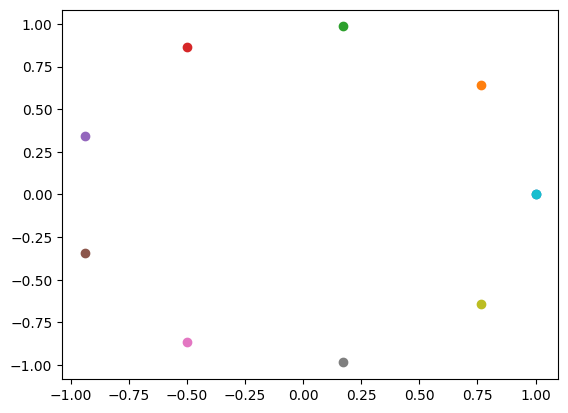

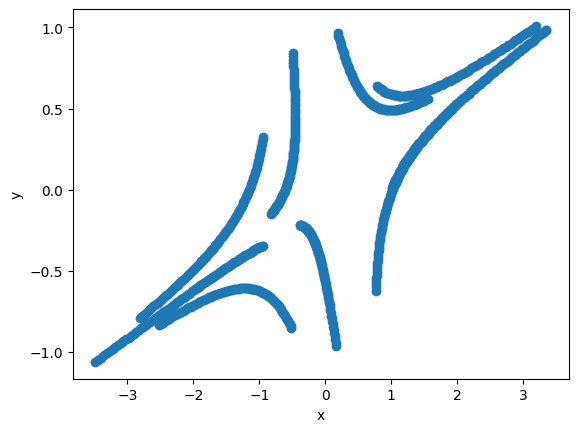

In [18]:
# Question 2c

# Given a system and its corresponding eigendecomposition:

# x' = x + y
# y' = x - 2y

# Apply a simple Forward–Euler discretization and simulate the system, starting from several initial points in a circle

import numpy as np
import matplotlib.pyplot as plt

# Define system
def f(x, y):
    return x + y, x - 2*y

# Define Forward Euler method
def forward_euler(x, y, h):
    x_next = x + h * f(x, y)[0]
    y_next = y + h * f(x, y)[1]
    return x_next, y_next

# Define list of initial points to simulate (in a circle)
initial_points = [(np.cos(theta), np.sin(theta)) for theta in np.linspace(0, 2*np.pi, 10)]

# plot initial points on a 2d plane
for x0, y0 in initial_points:
    plt.scatter(x0, y0)
plt.show()

# Define time step
h = 0.01


# Simulate the system and plot the results in a 2d plane
x_values = []
y_values = []
for x0, y0 in initial_points:
    x, y = x0, y0
    for _ in range(100):
        x, y = forward_euler(x, y, h)
        x_values.append(x)
        y_values.append(y)

plt.scatter(x_values, y_values)
plt.xlabel('x')
plt.ylabel('y')
plt.show()

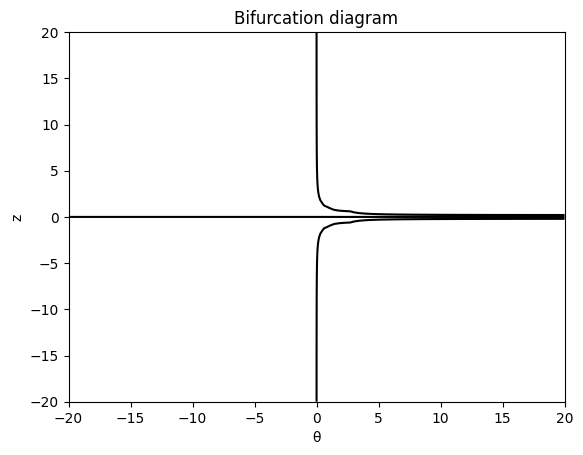

In [2]:
# Question 3

# We would like to study bifurcations; for this problem we will focus on the pitch-fork bifurcation 
# Develop code to generate two plots:
# (a) Let ζ = 0. Generate a 2D array, storing the values of dz/dt for a range of values for θ and z. Produce a plot of the fixed points, clearly showing the bifurcation, probably as a contour plot.

# Define function
def dzdt(θ, z, ζ):
    return ζ + z - θ*z**3

# Define range of values
θ = np.linspace(-20, 20, 100)
z = np.linspace(-20, 20, 100)

# Create meshgrid
θ, z = np.meshgrid(θ, z)

# Set value of ζ (part a)
ζ = 0

# Calculate the value of dz/dt
dz = dzdt(θ, z, ζ)

# Plot the contour
plt.contour(θ, z, dz, levels=[0], colors='k')
plt.xlabel('θ')
plt.ylabel('z')
plt.title('Bifurcation diagram')
plt.show()

In [20]:
# (b) We would like to see the more complex dependence on θ and ζ. Generate a 3D array, storing the values of dz/dt for a range of values for θ,ζ and z. We’re looking for a surface in 3D, the complex folded shape at which dz/dt is zero. Produce an isosurface plot of this surface.

import plotly.graph_objects as go

# Define range of values (including ζ)
θ = np.linspace(-10, 10, 50)
ζ = np.linspace(-10, 10, 50)
z = np.linspace(-10, 10, 50)

# Create meshgrid
θ, ζ, z = np.meshgrid(θ, ζ, z)

# Calc value of dz/dtx
dz = dzdt(θ, z, ζ)

# Create isosurface plot
fig = go.Figure(data=go.Isosurface(
    x=θ.flatten(),
    y=ζ.flatten(),
    z=z.flatten(),
    value=dz.flatten(),
    isomin=0,
    isomax=0,
    opacity=1,
    surface_count=1,
    colorscale='plasma',
))

fig.update_layout(
    scene = dict(
        xaxis_title='θ',
        yaxis_title='ζ',
        zaxis_title='z',
    )
)

fig.show()
